# GAIA Spatial Exploration Data Science

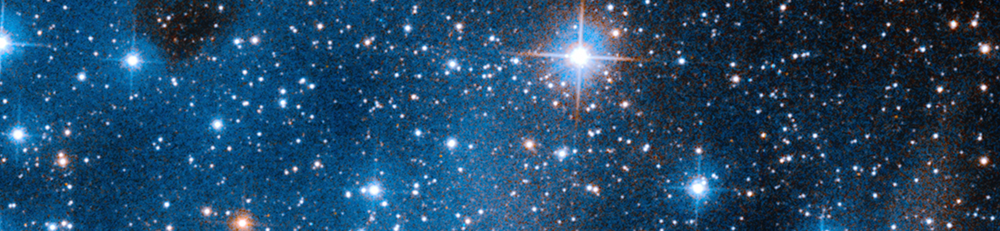

This project focuses on the spatial exploration of GAIA data. It uses concepts from basic astrometry, kinematics, and dynamics to provide insights into local disk kinematics, measuring how stars near the Sun move in the Milky Way through proper motion, radial velocity and parallax. Additionally, the project studies open clusters, which are groups of stars that formed together from the same molecular cloud, are usually young (millions to a few billion years old), and share similar motion, age, and chemical composition.🔭✨

### Objective

We will identify the clusters of stellar proper motion in our data and analyze them to understand how stellar evolution affects us.

### Importing the libraries

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

### Loading the data 

In [6]:
df = pd.read_csv("GaiaSource.csv")

In [7]:
df

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,scan_direction_mean_k4,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_mag,phot_variable_flag,l,b,ecl_lon,ecl_lat
0,1635378410781933568,65408,973786105,2015.0,44.996152,14.379929,0.005616,6.517028,NaN,NaN,...,25.226347,30,1567.255110,5.856073,17.536921,NOT_AVAILABLE,176.951072,-48.901522,42.533723,-16.329572
1,1635378410781933568,34359896320,1010840134,2015.0,45.004970,0.156231,0.019875,0.528851,NaN,NaN,...,28.650621,68,40086.238958,27.159845,14.017282,NOT_AVAILABLE,176.944759,-48.885280,42.546862,-16.318524
2,1635378410781933568,34361129088,388985243,2015.0,45.004312,0.347814,0.021042,1.100095,NaN,NaN,...,28.207079,52,1761.880082,19.831304,17.409829,NOT_AVAILABLE,176.942786,-48.884943,42.546563,-16.317215
3,1635378410781933568,309238066432,590730619,2015.0,44.995037,2.168152,0.038152,1.215309,NaN,NaN,...,25.310766,61,275.451290,2.733062,19.424658,NOT_AVAILABLE,176.914265,-48.879747,42.542548,-16.298139
4,1635378410781933568,343597448960,329156827,2015.0,44.963892,11.881098,0.043596,5.411748,NaN,NaN,...,27.213010,53,1025.723310,10.073989,17.997195,NOT_AVAILABLE,176.875418,-48.898381,42.513189,-16.283803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218448,1635378410781933568,14921025624532736,360272742,2015.0,45.840498,0.597650,9.130125,0.389516,NaN,NaN,...,25.829742,63,3481.243336,9.832782,16.670434,NOT_AVAILABLE,168.939985,-41.663494,46.028655,-7.826143
218449,1635378410781933568,14921025624533888,616104949,2015.0,45.836316,1.050996,9.133721,0.700946,NaN,NaN,...,25.784980,57,609.708253,4.083088,18.561965,NOT_AVAILABLE,168.932655,-41.663435,46.025668,-7.821535
218450,1635378410781933568,14921059984272128,1062009676,2015.0,45.857035,0.122367,9.132760,0.099148,NaN,NaN,...,29.490643,79,21878.692612,21.994991,14.674717,NOT_AVAILABLE,168.954330,-41.650899,46.045222,-7.828179
218451,1635378410781933568,14921128703751040,989948028,2015.0,45.845190,2.005531,9.143289,1.342038,NaN,NaN,...,25.893215,61,277.107730,3.519941,19.418148,NOT_AVAILABLE,168.933278,-41.650470,46.036860,-7.814800


### Data Exploratory Analysis 

In [8]:
df.shape

(218453, 57)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218453 entries, 0 to 218452
Data columns (total 57 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   solution_id                    218453 non-null  int64  
 1   source_id                      218453 non-null  int64  
 2   random_index                   218453 non-null  int64  
 3   ref_epoch                      218453 non-null  float64
 4   ra                             218453 non-null  float64
 5   ra_error                       218453 non-null  float64
 6   dec                            218453 non-null  float64
 7   dec_error                      218453 non-null  float64
 8   parallax                       1651 non-null    float64
 9   parallax_error                 1651 non-null    float64
 10  pmra                           1651 non-null    float64
 11  pmra_error                     1651 non-null    float64
 12  pmdec                         

In [10]:
df.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,scan_direction_mean_k3,scan_direction_mean_k4,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_mag,l,b,ecl_lon,ecl_lat
count,2.184530e+05,2.184530e+05,2.184530e+05,218453.0,218453.000000,218453.000000,218453.000000,218453.000000,1651.000000,1651.000000,...,218453.000000,218453.000000,218453.000000,2.184530e+05,218453.000000,218453.000000,218453.000000,218453.000000,218453.000000,218453.000000
mean,1.635378e+18,7.581390e+15,5.714467e+08,2015.0,47.606374,10.728612,6.350575,6.051332,3.978920,0.359373,...,-37.539343,24.612699,69.458057,2.707078e+04,41.101292,18.010538,173.085796,-42.519613,46.935632,-10.935429
std,0.000000e+00,4.317732e+15,3.304132e+08,0.0,3.822753,17.772902,2.561108,10.271933,3.949751,0.162593,...,20.344145,2.859088,34.460676,5.053226e+05,1143.647131,2.041736,2.970404,4.030734,4.191321,2.003504
min,1.635378e+18,6.540800e+04,7.480000e+02,2015.0,39.397369,0.052957,0.005616,0.040651,-1.407067,0.213619,...,-59.998447,-44.976276,11.000000,4.115938e+01,0.736514,5.846408,165.741453,-49.147766,38.538360,-16.329572
25%,1.635378e+18,3.816748e+15,2.848252e+08,2015.0,44.620210,0.439308,4.402386,0.307683,1.943555,0.257952,...,-45.736170,22.994656,52.000000,2.348141e+02,2.781664,16.886933,170.825166,-45.927253,43.520801,-12.369074
50%,1.635378e+18,7.648512e+15,5.709666e+08,2015.0,47.264427,1.468667,6.448229,0.962877,3.073810,0.296897,...,-42.318300,24.555075,66.000000,6.391877e+02,3.939010,18.510699,173.565442,-42.849207,46.538884,-10.709341
75%,1.635378e+18,1.138297e+16,8.579729e+08,2015.0,50.554755,12.775954,8.471597,8.547932,4.821773,0.382491,...,-37.586773,26.259995,79.000000,2.851904e+03,8.742419,19.597960,175.576626,-39.335550,50.146950,-9.366028
max,1.635378e+18,1.492113e+16,1.142672e+09,2015.0,56.225540,98.001988,11.997573,91.497018,67.888071,0.997921,...,59.999620,44.617382,386.000000,7.436095e+07,310026.391593,21.488598,177.882343,-34.186913,56.183841,-6.997439


In [11]:
df.dtypes

solution_id                        int64
source_id                          int64
random_index                       int64
ref_epoch                        float64
ra                               float64
ra_error                         float64
dec                              float64
dec_error                        float64
parallax                         float64
parallax_error                   float64
pmra                             float64
pmra_error                       float64
pmdec                            float64
pmdec_error                      float64
ra_dec_corr                      float64
ra_parallax_corr                 float64
ra_pmra_corr                     float64
ra_pmdec_corr                    float64
dec_parallax_corr                float64
dec_pmra_corr                    float64
dec_pmdec_corr                   float64
parallax_pmra_corr               float64
parallax_pmdec_corr              float64
pmra_pmdec_corr                  float64
astrometric_n_ob

In [12]:
cols_astrom = [
    "ra", "dec", "parallax", "pmra", "pmdec",
    "ra_error", "dec_error", "parallax_error",
    "pmra_error", "pmdec_error","phot_g_mean_mag","astrometric_excess_noise"]

df_astrom = df[cols_astrom]

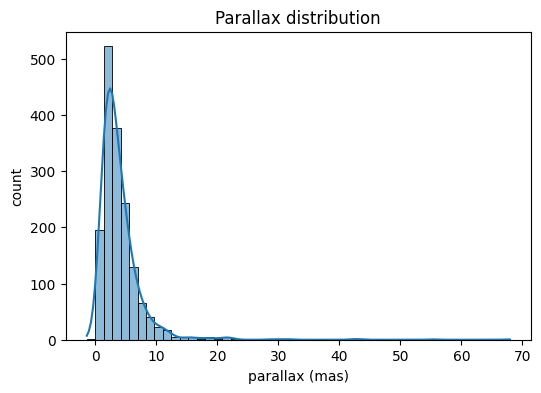

In [13]:
plt.figure(figsize=(6,4))
sns.histplot(df_astrom["parallax"], bins=50, kde=True)
plt.title("Parallax distribution")
plt.xlabel("parallax (mas)")
plt.ylabel("count")
plt.show()

Parallax is the tiny angular shift of a star due to Earth’s orbit, it measures distance. For distant stars, parallax values cluster near small positive values, close to zero. Large parallaxes only occur for very nearby stars, which are rare. Negative parallaxes exist, but they come from measurement uncertainty, not physics.

In the graph, there's a strong peak at small parallax (≈ 0–5 mas), right-skewed distribution, long tail (up to ~70 mas). However, most sources are distant (small parallax) from the Earth/Sun and just a few nearby stars (large parallax). Negative values may be statistical noise in the astrometric fitting process.

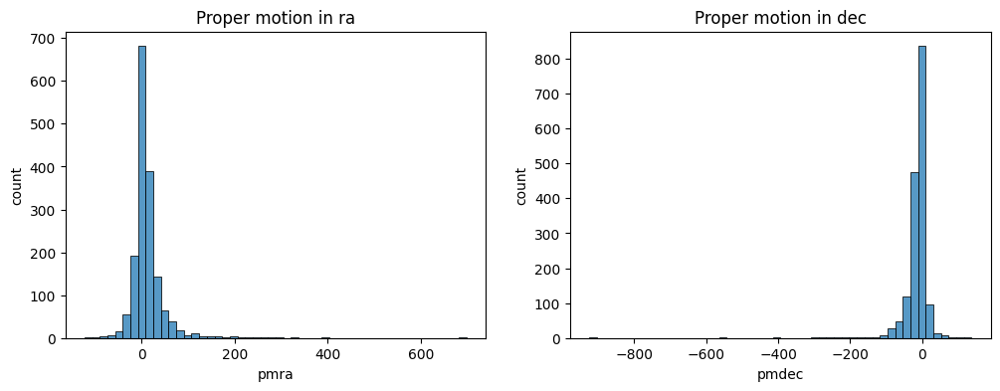

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(12,4))

sns.histplot(df_astrom["pmra"], bins=50, ax=ax[0])
ax[0].set_title("Proper motion in ra")
ax[0].set_xlabel("pmra")   
ax[0].set_ylabel("count")

sns.histplot(df_astrom["pmdec"], bins=50, ax=ax[1])
ax[1].set_title("Proper motion in dec")
ax[1].set_xlabel("pmdec")   
ax[1].set_ylabel("count")

plt.show()

- pmra: peak near zero, extremely long positive tail (up to ~700 mas/yr)

- pmdec: negative peak (~-10 mas/yr), extreme negative tail (down to ~-800 mas/yr)

Most stars have small proper motion, therefore a few of them are very nearby - very large proper motion. 
Asymmetry is normal (non-isotropic field). These extremes may be real (nearby stars, halo stars, fast-moving objects). Any of them may also be an inadequate astrometric solution.

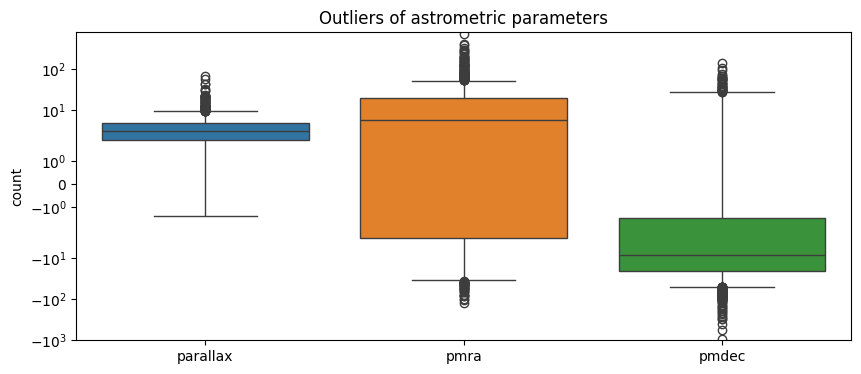

In [15]:
plt.figure(figsize=(10,4))
sns.boxplot(data=df_astrom[["parallax", "pmra", "pmdec"]])
plt.yscale("symlog")
plt.title("Outliers of astrometric parameters")
plt.ylabel("count")
plt.show()

Proper motion (pmra and pmdec) measures angular velocity, not distance. Stars have real space velocities, and those velocities vary a lot. Outliers are not automatically bad data. They can be: Nearby stars (large proper motion even with modest velocities), halo stars (high space velocities), high-velocity objects or poor astrometric solutions (bad fits, binaries, faint sources).

For a good practice in astrometric analysis, as linear scale hides the tails, we used log scale to see: core population, halo of fast movers, extreme outliers.

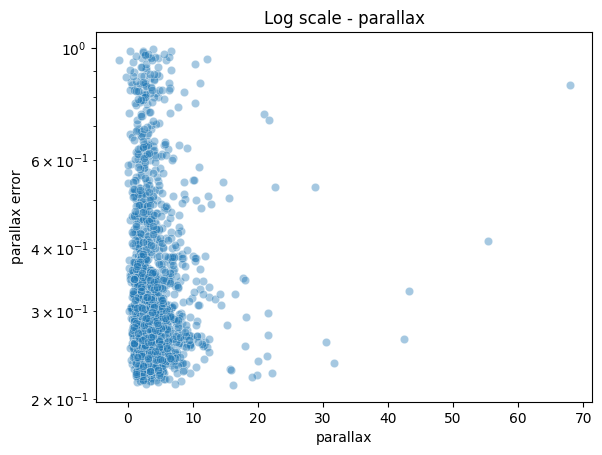

In [16]:
sns.scatterplot(
    x="parallax",
    y="parallax_error",
    data=df_astrom,
    alpha=0.4
)
plt.title("Log scale - parallax")
plt.ylabel("parallax error")
plt.yscale("log")

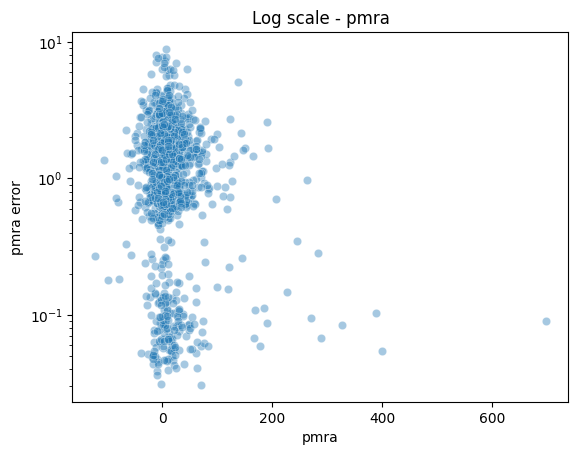

In [17]:
sns.scatterplot(
    x="pmra",
    y="pmra_error",
    data=df_astrom,
    alpha=0.4
)
plt.title("Log scale - pmra")
plt.ylabel("pmra error")
plt.yscale("log")

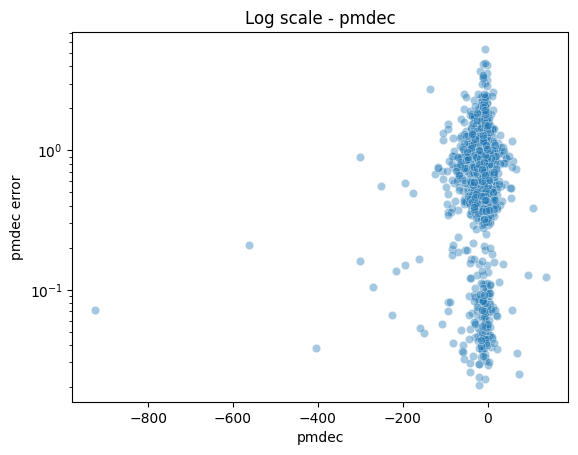

In [18]:
sns.scatterplot(
    x="pmdec",
    y="pmdec_error",
    data=df_astrom,
    alpha=0.4
)
plt.title("Log scale - pmdec")
plt.ylabel("pmdec error")
plt.yscale("log")

In the context of proper motion (pm) and errors, they are referring to how to identify nearby or rare stars that are scientifically worth studying, based on the relation between the proper motion value and its error.

Large pm + small error → real and interesting star: the star has a high proper motion, which usually means it is relatively close to us. Small error means the measurement is reliable, so it’s not a false detection.

Large pm + large error → suspicious: High proper motion but with high uncertainty, for example: poor measurement, satellite error or misidentified star.

Small pm + large error → weak star: Small proper motion (appears distant or static) with large error. Usually corresponds to faint stars, poorly detected, giving unreliable information.

Studying real and interesting star is important for several scientific reasons:

- Nearby stars and the solar neighborhood
- Stellar populations and evolution
- Exoplanet studies
- Galactic archaeology
- Astrophysical laboratories

In [19]:
df_astrom

,ra,dec,parallax,pmra,pmdec,ra_error,dec_error,parallax_error,pmra_error,pmdec_error,phot_g_mean_mag,astrometric_excess_noise
0,44.996152,0.005616,NaN,NaN,NaN,14.379929,6.517028,NaN,NaN,NaN,17.536921,0.891362
1,45.004970,0.019875,NaN,NaN,NaN,0.156231,0.528851,NaN,NaN,NaN,14.017282,0.494174
2,45.004312,0.021042,NaN,NaN,NaN,0.347814,1.100095,NaN,NaN,NaN,17.409829,0.532441
3,44.995037,0.038152,NaN,NaN,NaN,2.168152,1.215309,NaN,NaN,NaN,19.424658,1.525818
4,44.963892,0.043596,NaN,NaN,NaN,11.881098,5.411748,NaN,NaN,NaN,17.997195,0.486188
...,...,...,...,...,...,...,...,...,...,...,...,...
218448,45.840498,9.130125,NaN,NaN,NaN,0.597650,0.389516,NaN,NaN,NaN,16.670434,1.134560
218449,45.836316,9.133721,NaN,NaN,NaN,1.050996,0.700946,NaN,NaN,NaN,18.561965,0.138394
218450,45.857035,9.132760,NaN,NaN,NaN,0.122367,0.099148,NaN,NaN,NaN,14.674717,0.430440
218451,45.845190,9.143289,NaN,NaN,NaN,2.005531,1.342038,NaN,NaN,NaN,19.418148,1.539186


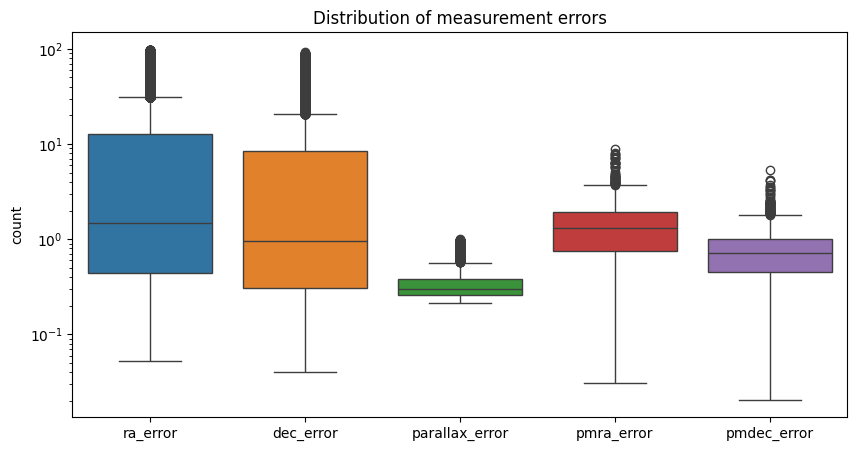

In [20]:
errors = [
    "ra_error", "dec_error",
    "parallax_error",
    "pmra_error", "pmdec_error"
]

plt.figure(figsize=(10,5))
sns.boxplot(data=df_astrom[errors])
plt.yscale("log")
plt.title("Distribution of measurement errors")
plt.ylabel("count")
plt.show()

Ra and dec errors have the largest variation and many stars with high errors. This means that the sky position measurements are generally less precise compared to the other quantities.

Parallax error has the smallest spread, showing that parallax is usually measured more accurately. This is important because parallax is used to estimate distances.

Proper motion errors (pmra and pmdec) are more precise than positions, but less precise than parallax. Some stars still show larger errors, especially faint or distant ones.

In [21]:
#good_stars = df[df["parallax_error"] < 1.0]
good_stars = df_astrom[df_astrom["parallax"]/df_astrom["parallax_error"] > 5]

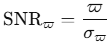

SNR (signal-to-noise ratio) measures how strong a signal is compared to the background noise.

In astronomy and physics:

SNR ≈ 3 → detection is weak, often unreliable

SNR ≥ 5 → considered a robust / trustworthy measurement

SNR ≥ 10 → very high precision

In [22]:
good_stars

,ra,dec,parallax,pmra,pmdec,ra_error,dec_error,parallax_error,pmra_error,pmdec_error,phot_g_mean_mag,astrometric_excess_noise
91,45.034330,0.235392,6.352951,43.752313,-7.641990,0.305989,0.218802,0.307910,0.070542,0.087402,7.991378,0.717101
116,45.165007,0.200068,3.900329,10.036263,-55.109173,2.583882,1.197789,0.323488,4.611414,2.522929,10.580959,0.253463
154,45.086155,0.248825,3.155313,2.932284,-1.602867,0.213836,0.180326,0.273484,1.908644,1.035259,10.743102,0.398901
159,45.066542,0.248211,2.292367,3.661982,-18.414912,0.276039,0.200958,0.280972,2.065052,1.129851,11.075682,0.422492
192,45.136038,0.335044,1.582077,0.340802,-2.379387,0.170697,0.170130,0.261539,1.220476,0.710632,10.168701,0.317500
...,...,...,...,...,...,...,...,...,...,...,...,...
217863,46.632775,9.742502,3.287230,-16.401071,-49.463560,0.611409,0.404600,0.516507,1.898829,0.968842,11.787151,1.447701
218038,47.284820,9.747770,3.395487,11.877513,13.401850,0.347811,0.263946,0.344977,0.988650,0.505919,11.276272,0.668363
218172,46.950227,9.812712,1.628593,1.444736,-3.996053,0.201251,0.195719,0.271014,0.672895,0.368630,9.996420,0.405705
218250,46.958223,9.923018,5.165455,10.324829,3.387132,0.353048,0.330422,0.462912,0.354675,0.371323,7.842462,1.376430


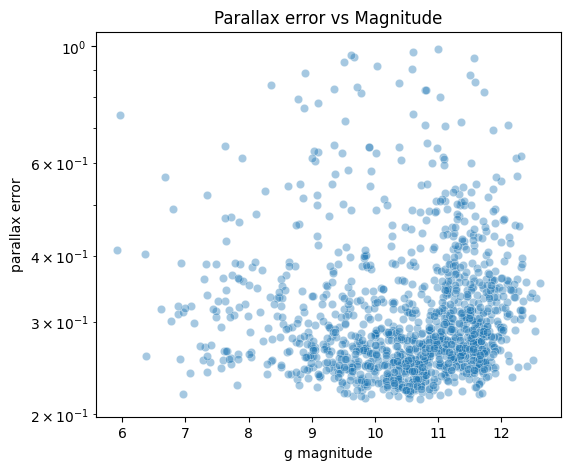

In [23]:
plt.figure(figsize=(6,5))
sns.scatterplot(
    x="phot_g_mean_mag",
    y="parallax_error",
    data=good_stars,
    alpha=0.4
)
plt.yscale("log")
plt.title("Parallax error vs Magnitude")
plt.xlabel("g magnitude")
plt.ylabel("parallax error")
plt.show()

Brighter stars (small G magnitude): smaller parallax error (well-measured, reliable distance)

Fainter stars (large G magnitude): larger parallax error (less reliable distance)

Using SNR > 5 is more adaptive than a fixed cutoff (for example df["parallax_error"] < 0.2), because it accounts for stars with larger parallaxes that can tolerate larger errors. Instead of blindly picking stars with tiny errors, we pick stars where the signal (parallax) dominates the noise (error). That’s much more meaningful scientifically.

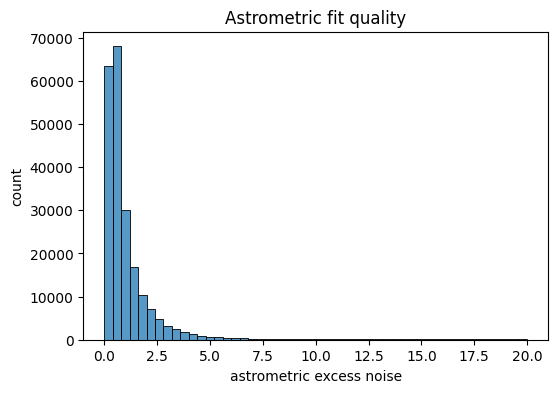

In [24]:
plt.figure(figsize=(6,4))
sns.histplot(df_astrom["astrometric_excess_noise"], bins=50)
plt.title("Astrometric fit quality")
plt.xlabel("astrometric excess noise")
plt.ylabel("count")
plt.show()

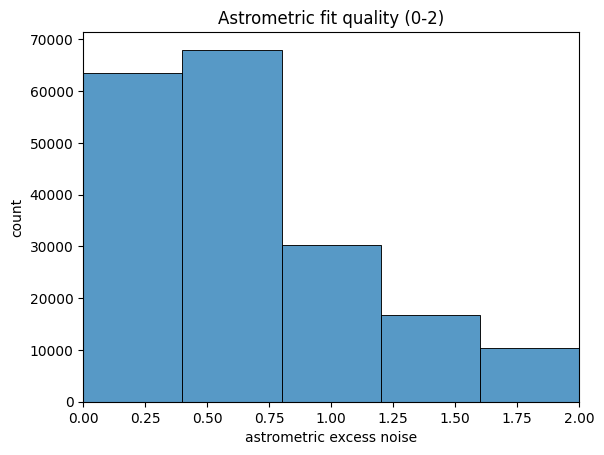

In [25]:
sns.histplot(df_astrom["astrometric_excess_noise"], bins=50)
plt.xlim(0, 2)
plt.title("Astrometric fit quality (0-2)")
plt.xlabel("astrometric excess noise")
plt.ylabel("count")
plt.show()

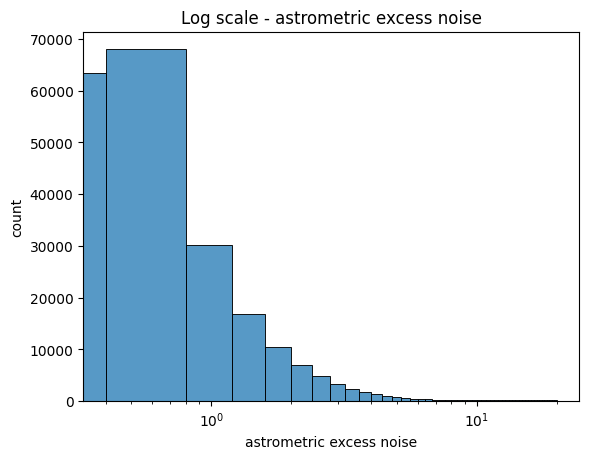

In [26]:
sns.histplot(df_astrom["astrometric_excess_noise"], bins=50)
plt.xscale("log")
plt.title("Log scale - astrometric excess noise")
plt.xlabel("astrometric excess noise")
plt.ylabel("count")
plt.show()

A big peak very close to 0, and a long tail extending up to ~20. GAIA tries to fit the observations using a single point-source star model. If the fit works well, no extra term is needed, and astrometric_excess_noise ≈ 0. If the fit doesn't work well, GAIA has to introduce an additional noise term to account for the mismatch. That additional term is the astrometric_excess_noise.

In [27]:
df_astrom[df_astrom["astrometric_excess_noise"] < 1]

,ra,dec,parallax,pmra,pmdec,ra_error,dec_error,parallax_error,pmra_error,pmdec_error,phot_g_mean_mag,astrometric_excess_noise
0,44.996152,0.005616,NaN,NaN,NaN,14.379929,6.517028,NaN,NaN,NaN,17.536921,0.891362
1,45.004970,0.019875,NaN,NaN,NaN,0.156231,0.528851,NaN,NaN,NaN,14.017282,0.494174
2,45.004312,0.021042,NaN,NaN,NaN,0.347814,1.100095,NaN,NaN,NaN,17.409829,0.532441
4,44.963892,0.043596,NaN,NaN,NaN,11.881098,5.411748,NaN,NaN,NaN,17.997195,0.486188
5,44.998326,0.066335,NaN,NaN,NaN,1.953613,1.112199,NaN,NaN,NaN,19.360209,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
218443,45.791348,9.115565,NaN,NaN,NaN,18.048335,7.274865,NaN,NaN,NaN,20.281025,0.000000
218445,45.845940,9.117229,NaN,NaN,NaN,0.154804,0.133720,NaN,NaN,NaN,14.185418,0.654555
218447,45.831571,9.127799,NaN,NaN,NaN,1.013164,0.636519,NaN,NaN,NaN,18.235282,0.955748
218449,45.836316,9.133721,NaN,NaN,NaN,1.050996,0.700946,NaN,NaN,NaN,18.561965,0.138394


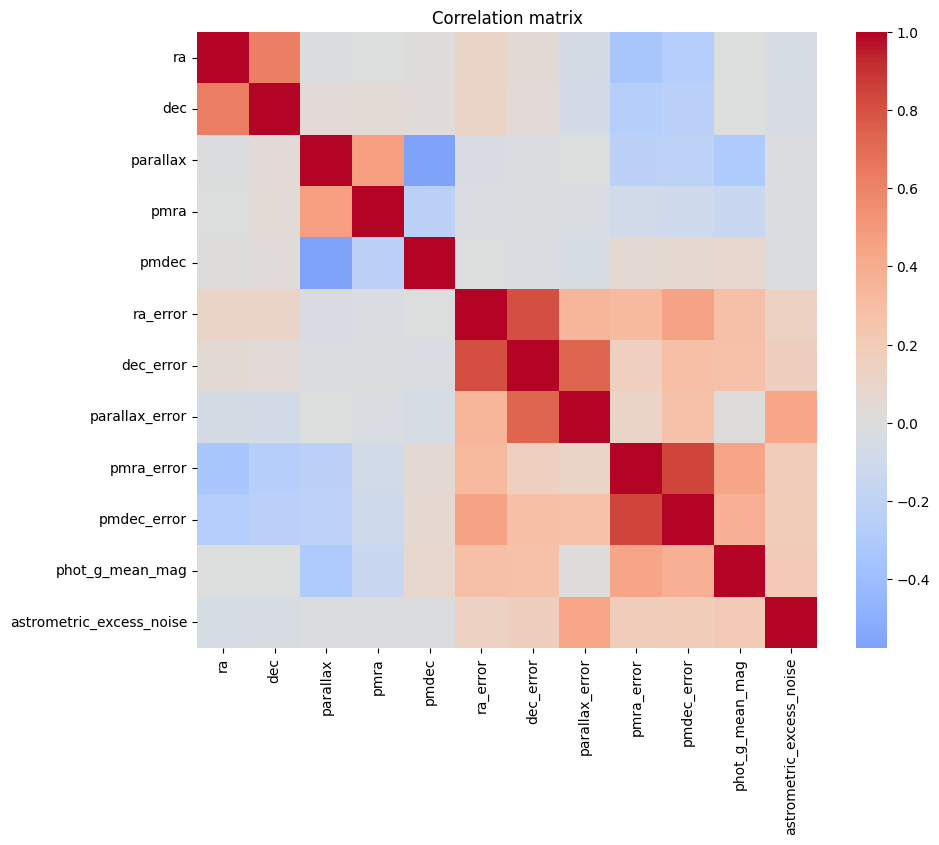

In [28]:
corr = df_astrom.corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Correlation matrix")
plt.show()

- Astrometric parameters

ra and dec are moderately correlated, parallax ↔ pmra/pmdec mild to moderate correlations

- Error

ra_error and dec_error have strong positive correlation, parallax_error ↔ pmra_error ↔ pmdec_error have strong positive correlations

- Magnitude and errors

phot_g_mean_mag and astrometric errors have clear positive correlation

- Proper motion components

pmra and pmdec have weak correlation

In [29]:
df_filter= df[['ra','dec','pmra','pmdec','parallax','parallax_error','phot_g_mean_mag']]

In [30]:
df_filter.isna().sum()

ra                      0
dec                     0
pmra               216802
pmdec              216802
parallax           216802
parallax_error     216802
phot_g_mean_mag         0
dtype: int64

## Open clustering

In [31]:
df_kin=df_filter[(df_filter['parallax'].notna()) & (df_filter['parallax']>0) & (df_filter['parallax']/df_filter['parallax_error']>5)]

Main reasons for null or invalide distances

1. Parallax is missing
2. Parallax <= 0
3. ϖ/ϖσ > 5 is safe and reliable

In [32]:
df_kin.shape

(1291, 7)

In [33]:
df_kin

,ra,dec,pmra,pmdec,parallax,parallax_error,phot_g_mean_mag
91,45.034330,0.235392,43.752313,-7.641990,6.352951,0.307910,7.991378
116,45.165007,0.200068,10.036263,-55.109173,3.900329,0.323488,10.580959
154,45.086155,0.248825,2.932284,-1.602867,3.155313,0.273484,10.743102
159,45.066542,0.248211,3.661982,-18.414912,2.292367,0.280972,11.075682
192,45.136038,0.335044,0.340802,-2.379387,1.582077,0.261539,10.168701
...,...,...,...,...,...,...,...
217863,46.632775,9.742502,-16.401071,-49.463560,3.287230,0.516507,11.787151
218038,47.284820,9.747770,11.877513,13.401850,3.395487,0.344977,11.276272
218172,46.950227,9.812712,1.444736,-3.996053,1.628593,0.271014,9.996420
218250,46.958223,9.923018,10.324829,3.387132,5.165455,0.462912,7.842462


In [34]:
df_kin.isna().sum()

ra                 0
dec                0
pmra               0
pmdec              0
parallax           0
parallax_error     0
phot_g_mean_mag    0
dtype: int64

In [35]:
df_kin['distance_pc'] = 1000 / df_kin['parallax']

C:\Users\diego.araujo\AppData\Local\Temp\ipykernel_22232\1589094159.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_kin['distance_pc'] = 1000 / df_kin['parallax']


This is the distance from the star to the Sun (or Earth)

The standard parallax–distance relation is:

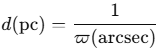

If your parallax is in mas (milliarcseconds):

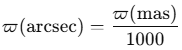

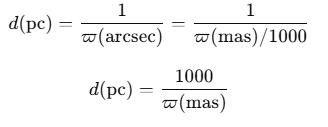

In [36]:
df_kin["distance_km"] = df_kin["distance_pc"] * 3.086e13

C:\Users\diego.araujo\AppData\Local\Temp\ipykernel_22232\1098909548.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_kin["distance_km"] = df_kin["distance_pc"] * 3.086e13


1 parsec ≈ 3.086 × 10¹³ km

Converting the distance_pc in distance_km:

In [37]:
df_kin

,ra,dec,pmra,pmdec,parallax,parallax_error,phot_g_mean_mag,distance_pc,distance_km
91,45.034330,0.235392,43.752313,-7.641990,6.352951,0.307910,7.991378,157.407170,4.857585e+15
116,45.165007,0.200068,10.036263,-55.109173,3.900329,0.323488,10.580959,256.388632,7.912153e+15
154,45.086155,0.248825,2.932284,-1.602867,3.155313,0.273484,10.743102,316.925747,9.780329e+15
159,45.066542,0.248211,3.661982,-18.414912,2.292367,0.280972,11.075682,436.230356,1.346207e+16
192,45.136038,0.335044,0.340802,-2.379387,1.582077,0.261539,10.168701,632.080502,1.950600e+16
...,...,...,...,...,...,...,...,...,...
217863,46.632775,9.742502,-16.401071,-49.463560,3.287230,0.516507,11.787151,304.207482,9.387843e+15
218038,47.284820,9.747770,11.877513,13.401850,3.395487,0.344977,11.276272,294.508551,9.088534e+15
218172,46.950227,9.812712,1.444736,-3.996053,1.628593,0.271014,9.996420,614.026954,1.894887e+16
218250,46.958223,9.923018,10.324829,3.387132,5.165455,0.462912,7.842462,193.593795,5.974305e+15


In [38]:
df_kin['proper_motion'] = np.sqrt(df_kin['pmra']**2 + df_kin['pmdec']**2)

C:\Users\diego.araujo\AppData\Local\Temp\ipykernel_22232\326805043.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_kin['proper_motion'] = np.sqrt(df_kin['pmra']**2 + df_kin['pmdec']**2)


Proper motion measures how fast a star moves across the sky, as seen from Earth. It isn't a linear speed (such as km/s), it is an angular speed, usually in: mas/year

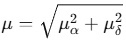

In [39]:
df_kin['vt']=4.74 * df_kin['distance_pc'] * df_kin['proper_motion']

C:\Users\diego.araujo\AppData\Local\Temp\ipykernel_22232\3617088815.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_kin['vt']=4.74 * df_kin['distance_pc'] * df_kin['proper_motion']


Converting the proper motion (angular velocity) in tangential velocity (linear speed)

In [40]:
df_kin

,ra,dec,pmra,pmdec,parallax,parallax_error,phot_g_mean_mag,distance_pc,distance_km,proper_motion,vt
91,45.034330,0.235392,43.752313,-7.641990,6.352951,0.307910,7.991378,157.407170,4.857585e+15,44.414693,33138.245879
116,45.165007,0.200068,10.036263,-55.109173,3.900329,0.323488,10.580959,256.388632,7.912153e+15,56.015601,68074.757583
154,45.086155,0.248825,2.932284,-1.602867,3.155313,0.273484,10.743102,316.925747,9.780329e+15,3.341777,5020.110451
159,45.066542,0.248211,3.661982,-18.414912,2.292367,0.280972,11.075682,436.230356,1.346207e+16,18.775492,38822.683656
192,45.136038,0.335044,0.340802,-2.379387,1.582077,0.261539,10.168701,632.080502,1.950600e+16,2.403670,7201.544025
...,...,...,...,...,...,...,...,...,...,...,...
217863,46.632775,9.742502,-16.401071,-49.463560,3.287230,0.516507,11.787151,304.207482,9.387843e+15,52.111792,75142.258053
218038,47.284820,9.747770,11.877513,13.401850,3.395487,0.344977,11.276272,294.508551,9.088534e+15,17.907677,24998.588945
218172,46.950227,9.812712,1.444736,-3.996053,1.628593,0.271014,9.996420,614.026954,1.894887e+16,4.249200,12367.245867
218250,46.958223,9.923018,10.324829,3.387132,5.165455,0.462912,7.842462,193.593795,5.974305e+15,10.866221,9971.220243


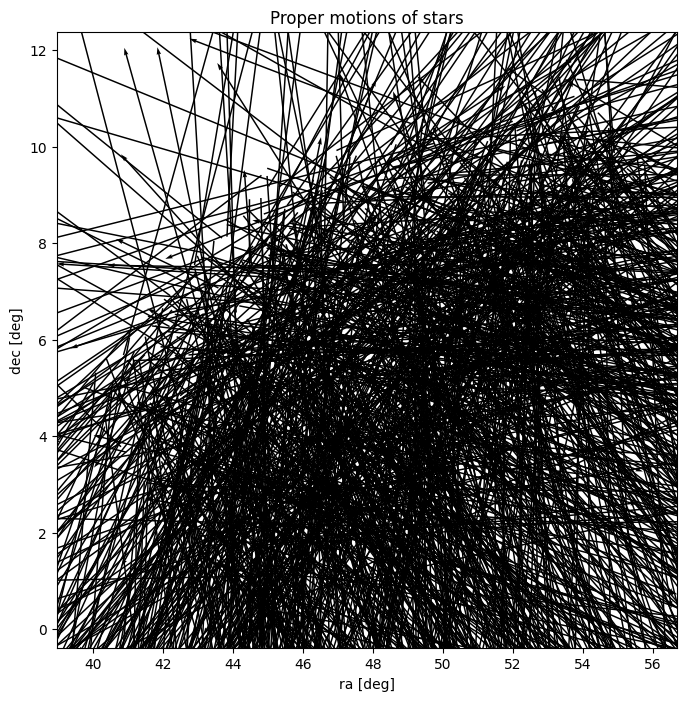

In [41]:
plt.figure(figsize=(8,8))
plt.quiver(df_kin['ra'], df_kin['dec'], df_kin['pmra'], df_kin['pmdec'], angles='xy', scale_units='xy', scale=1)
plt.title('Proper motions of stars')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.show()

The sample contains many stars with different motions, distances, and directions — typical of a random field population.

The plot is very dense and cluttered. Almost every point is covered by overlapping arrows, making it hard to see any clear pattern. However, because of overplotting, we cannot see a subtle kinematic pattern, moving group or cluster signal.

In [42]:
df_region = df_kin[(df_kin["ra"] > 39) & (df_kin["ra"] < 50) &
                      (df_kin["dec"] > 0) & (df_kin["dec"] < 2)]

It was selected a region of the sky to analyze better. Right now, we have stars in a thin strip of sky:

Ra roughly around 40–50 deg

Dec between 0 and 2 degrees


In [43]:
df_region

,ra,dec,pmra,pmdec,parallax,parallax_error,phot_g_mean_mag,distance_pc,distance_km,proper_motion,vt
91,45.034330,0.235392,43.752313,-7.641990,6.352951,0.307910,7.991378,157.407170,4.857585e+15,44.414693,33138.245879
116,45.165007,0.200068,10.036263,-55.109173,3.900329,0.323488,10.580959,256.388632,7.912153e+15,56.015601,68074.757583
154,45.086155,0.248825,2.932284,-1.602867,3.155313,0.273484,10.743102,316.925747,9.780329e+15,3.341777,5020.110451
159,45.066542,0.248211,3.661982,-18.414912,2.292367,0.280972,11.075682,436.230356,1.346207e+16,18.775492,38822.683656
192,45.136038,0.335044,0.340802,-2.379387,1.582077,0.261539,10.168701,632.080502,1.950600e+16,2.403670,7201.544025
...,...,...,...,...,...,...,...,...,...,...,...
16977,43.404079,1.877891,99.276772,35.523298,8.930454,0.267590,9.217370,111.976392,3.455591e+15,105.440894,55964.662705
17058,43.047190,1.783673,103.043782,17.743570,5.827472,0.242233,9.582516,171.600985,5.295606e+15,104.560295,85048.158735
17116,43.063213,1.928948,17.316999,1.942906,6.278582,0.246002,9.016979,159.271624,4.915122e+15,17.425652,13155.452420
17319,43.537070,1.953971,42.349470,57.070058,7.982588,0.343938,11.453932,125.272656,3.865914e+15,71.066652,42198.837178


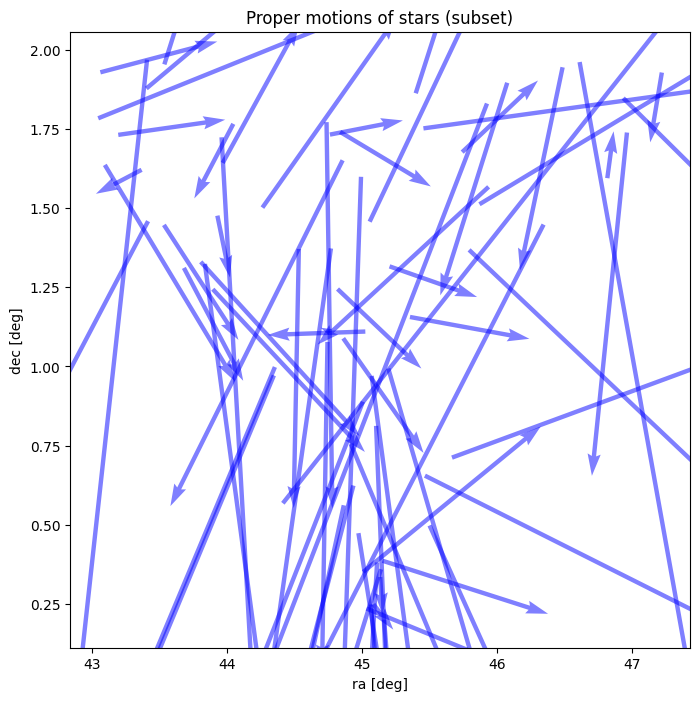

In [44]:
plt.figure(figsize=(8,8))
plt.quiver(df_region['ra'], df_region['dec'], df_region['pmra'], df_region['pmdec'],
           angles='xy', scale_units='xy', scale=20, color='blue', alpha=0.5)
plt.title('Proper motions of stars (subset)')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.show()

Each arrow is one star, the arrow base (tail) represents the star’s current position on the sky: ra and dec. Arrow direction is the direction of the star is moving across the sky. And the arrow length is the magnitude of the proper motion (how fast it’s moving, angularly).

If many arrows point in a similar direction, that suggests: a moving group, a star cluster or bulk motion from Galactic rotation

If arrows are randomly oriented, you’re seeing: a mix of stars at different distances and velocities

Very long arrows: nearby stars or high transverse velocities

In [45]:
df_sample = df_kin.sample(500)

We can provide a sample to analyze clearer through random data.

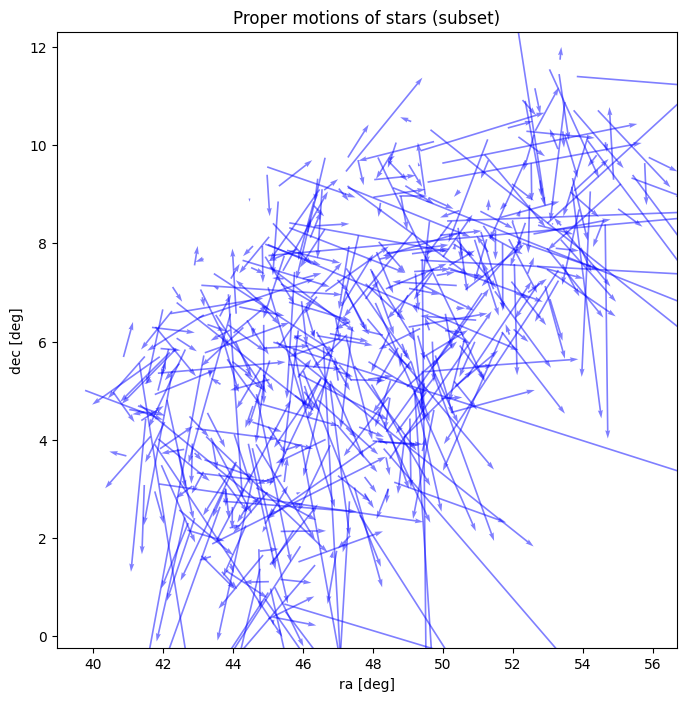

In [46]:
plt.figure(figsize=(8,8))
plt.quiver(df_sample['ra'], df_sample['dec'], df_sample['pmra'], df_sample['pmdec'],
           angles='xy', scale_units='xy', scale=20, color='blue', alpha=0.5)
plt.title('Proper motions of stars (subset)')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.show()

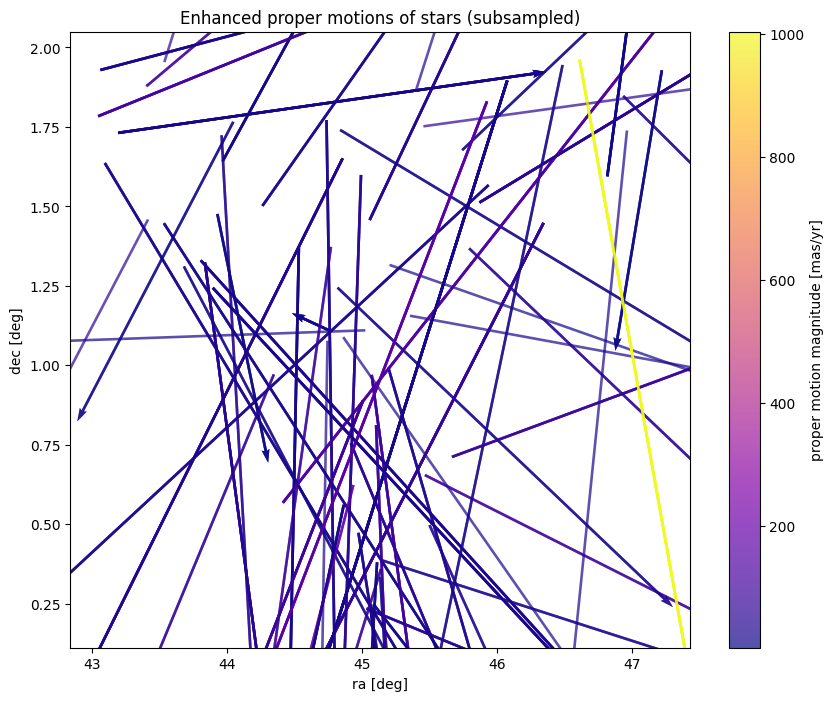

In [47]:
x = df_region['ra'].values
y = df_region['dec'].values
pm_x = df_region['pmra'].values
pm_y = df_region['pmdec'].values

pm_mag = df_region['proper_motion'].values

n_subsample = 200
indices = np.random.choice(len(x), n_subsample, replace=True)

x_sub = x[indices]
y_sub = y[indices]
pm_x_sub = pm_x[indices]
pm_y_sub = pm_y[indices]
pm_mag_sub = pm_mag[indices]

plt.figure(figsize=(10, 8))
q = plt.quiver(
    x_sub, y_sub, pm_x_sub, pm_y_sub,
    pm_mag_sub,                
    angles='xy', scale_units='xy', scale=5,
    cmap='plasma', alpha=0.7
)
plt.colorbar(q, label='proper motion magnitude [mas/yr]')
plt.title('Enhanced proper motions of stars (subsampled)')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.show()

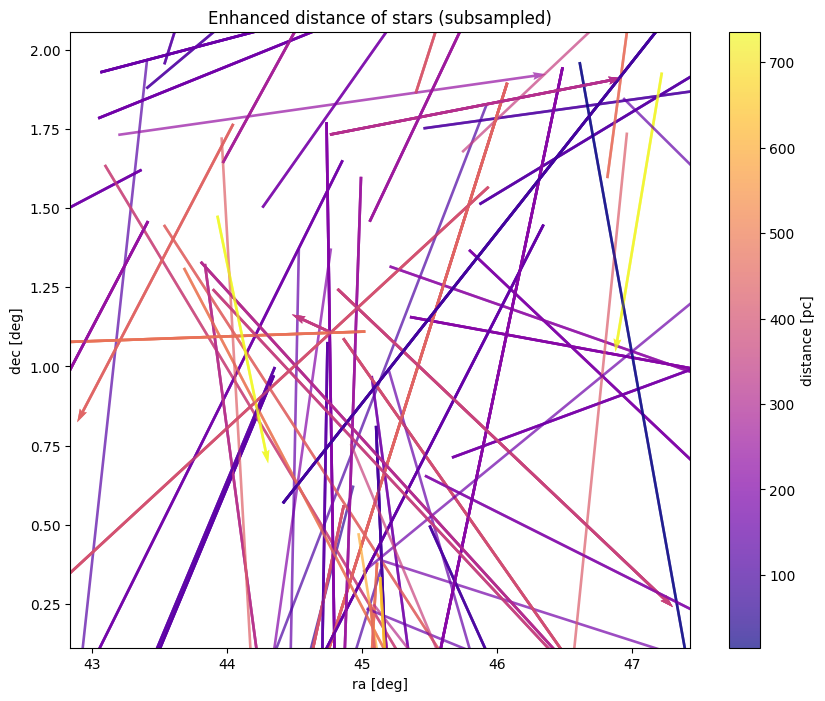

In [48]:
x = df_region['ra'].values
y = df_region['dec'].values
pm_x = df_region['pmra'].values
pm_y = df_region['pmdec'].values

pm_mag = df_region['distance_pc'].values

n_subsample = 200
indices = np.random.choice(len(x), n_subsample, replace=True)

x_sub = x[indices]
y_sub = y[indices]
pm_x_sub = pm_x[indices]
pm_y_sub = pm_y[indices]
pm_mag_sub = pm_mag[indices]

plt.figure(figsize=(10, 8))
q = plt.quiver(
    x_sub, y_sub, pm_x_sub, pm_y_sub,
    pm_mag_sub,                
    angles='xy', scale_units='xy', scale=5,
    cmap='plasma', alpha=0.7
)
plt.colorbar(q, label='distance [pc]')
plt.title('Enhanced distance of stars (subsampled)')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.show()

In [49]:
X = np.column_stack([
    df_kin['pmra'].values,
    df_kin['pmdec'].values
])

X_scaled = StandardScaler().fit_transform(X)

If the features have different scales, the larger-scale feature will dominate. Therefore, we need to scale the features so that they are on the same scale.

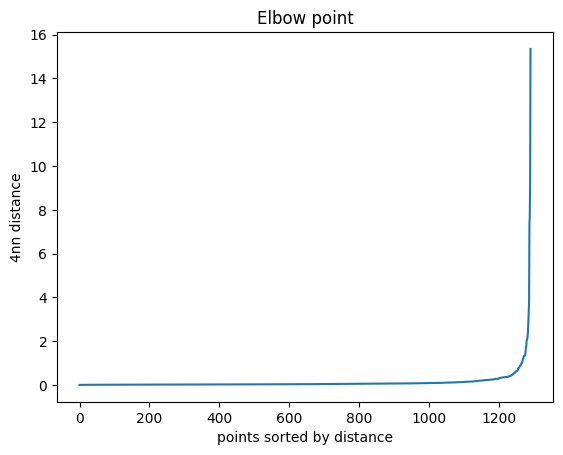

In [50]:
neighbors = NearestNeighbors(n_neighbors=4)
neighbors_fit = neighbors.fit(X_scaled)
distances, indices = neighbors_fit.kneighbors(X_scaled)
distances = np.sort(distances[:, 3])

plt.plot(distances)
plt.title("Elbow point")
plt.xlabel("points sorted by distance")
plt.ylabel("4nn distance")
plt.show()

As we scaled the data using StandardScaler, because the eps parameter needs to be expressed in units of standard deviation. To define its optimal value, we need to identify the elbow point — the point where the curve begins to rise sharply. This marks the boundary between dense regions and noise. Using the k-distance graph, it is possible to visualize where the density stops being uniform: before the elbow lies the dense region; after it, the points are considered noise.

In [51]:
db = DBSCAN(
    eps=0.9,       #try it in: 0.9,0.8,0.6,0.5,0.4
    min_samples=5  #minimum cluster size  
).fit(X_scaled)

labels = db.labels_
df_kin['cluster'] = labels

C:\Users\diego.araujo\AppData\Local\Temp\ipykernel_22232\3598634464.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_kin['cluster'] = labels


Now we will use DBSCAN (Density-Based Spatial Clustering of Applications with Noise) to find groups of points with high density and separate the noise, without needing to specify the number of clusters. Therefore, we need to define values for 
- eps: the maximum radius to consider two points as neighbors. If it is too small, everything becomes noise (-1). If it is too large, everything becomes a single cluster.
- min_samples: the minimum number of points within a radius eps for a point to be considered a core point.

Since we already have the elbow between 0.8 and 1.1, we will test the possible values within this range (0.9, 0.8, 0.6, 0.5, 0.4) to find an eps that consistently fits our model.

For defining min_samples, we use a simple rule: multiply the dimensionality of the data by 2.
Since we are using only 2 dimensions in the StandardScaler (pmra and pmdec), we have: min_samples = 2 * 2 = 4, but it's recommended to use 5 (more robust).

The curve remains almost flat up to approximately 0.4–0.6, then begins to rise gradually until around 1.0. After that, it increases sharply above roughly 1.2–1.5 and extends up to about 20 (extreme noise).The “elbow” point is approximately between 0.8 and 1.1.

In [52]:
print("noise: ",np.sum(labels == -1) / len(labels))

print(df_kin.groupby('cluster')[['pmra','pmdec']].std(),"\n")

print(df_kin['cluster'].value_counts())

noise:  0.019364833462432222
               pmra       pmdec
cluster                        
-1       182.794915  213.189818
 0        29.496083   24.206972 

cluster
 0    1266
-1      25
Name: count, dtype: int64


For eps = 0.9: the noise fraction is very low (1.936), and therefore DBSCAN classified almost everything as belonging to a cluster. This indicates that the eps value is relatively large.

Although the noise is extremely dispersed, the cluster is very compact — it is about 6–7 times (182.79 / 29.49) more concentrated than the noise. DBSCAN found only one cluster. The cluster contains 97.59% of the data, which suggests that the algorithm is likely over-connecting the space.

For eps = 0.8: the noise changes only slightly (2.4), and the ratio remains large (6–7 times). We still observe one dominant cluster, and most of the dataset remains density-connected.

For eps = 0.6 and 0.5: more than one cluster begins to appear.

For eps = 0.4: the algorithm again returns only one cluster.

In the first two eps values tested, we observe a compact kinematic core with a very dispersed background. In other words, DBSCAN is essentially separating the core from extreme outliers, rather than identifying multiple substructures. Since almost nothing changes between these eps values, this suggests that the algorithm is operating within a stable region of the parameter space.

In [53]:
for k in np.unique(df_kin['cluster']):
    if k == -1:
        continue

    print(f"\nCluster {k}")
    display(df_kin[df_kin.cluster == k][['parallax', 'pmra', 'pmdec']].head())


Cluster 0


,parallax,pmra,pmdec
91,6.352951,43.752313,-7.641990
116,3.900329,10.036263,-55.109173
154,3.155313,2.932284,-1.602867
159,2.292367,3.661982,-18.414912
192,1.582077,0.340802,-2.379387


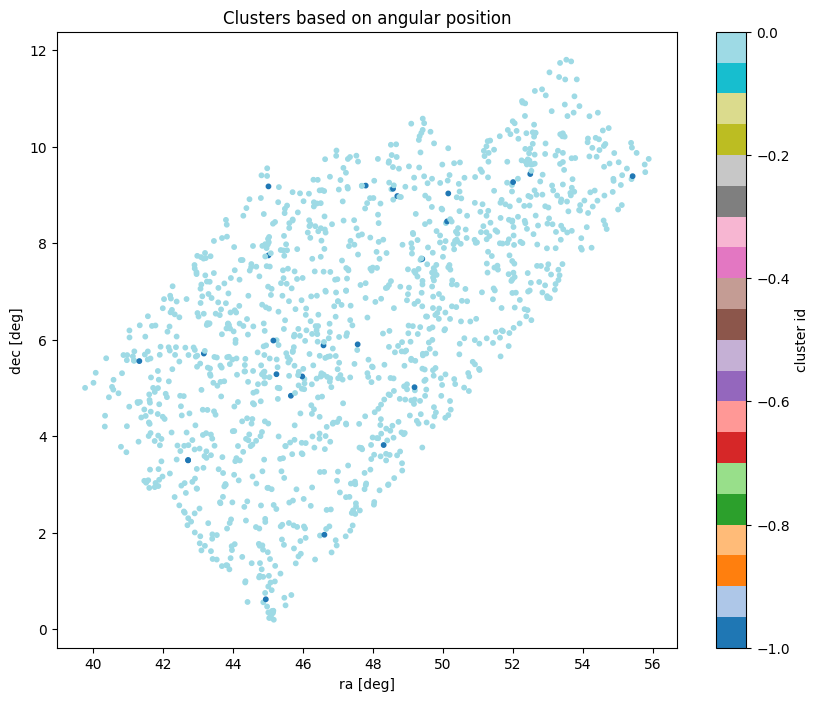

In [54]:
plt.figure(figsize=(10, 8))

scatter = plt.scatter(
    df_kin['ra'], df_kin['dec'],
    c=df_kin['cluster'],
    cmap='tab20',
    s=10
)

plt.title('Clusters based on angular position')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.colorbar(scatter, label='cluster id')
plt.show()

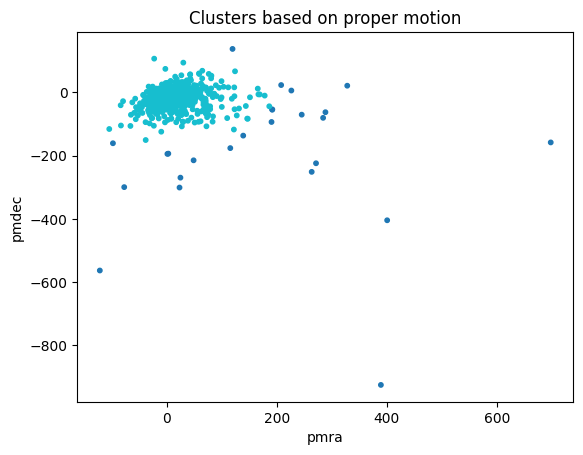

In [55]:
plt.scatter(df_kin['pmra'], df_kin['pmdec'], 
            c=df_kin['cluster'], cmap='tab10', s=10)
plt.title("Clusters based on proper motion")
plt.xlabel("pmra")
plt.ylabel("pmdec")
plt.show()

In [56]:
results = []

for e in [0.9, 0.8, 0.6, 0.5, 0.4]:
    db = DBSCAN(eps=e, min_samples=4).fit(X_scaled)
    labels = db.labels_
    
    ruido = np.sum(labels == -1) / len(labels)
    clusters = len(set(labels)) - (1 if -1 in labels else 0)
    
    results.append([e, ruido, clusters])

eps_ = pd.DataFrame(results, columns=['eps', 'noise', 'clusters'])
print(eps_)

   eps     noise  clusters
0  0.9  0.017041         1
1  0.8  0.021689         1
2  0.6  0.026336         2
3  0.5  0.030984         3
4  0.4  0.041053         1


Through density-based fragmentation, we observe that the behavior is not monotonic. For larger eps values, everything becomes connected, resulting in a single cluster. As we decrease eps, internal regions begin to separate and new clusters emerge. If eps is reduced further, some regions no longer satisfy the density requirement and are therefore classified as noise. The main cluster is not perfectly homogeneous in density. When subdivision occurs, we observe a core and a periphery (an artificial subdivision), rather than clearly separated centers. In summary, there is one dominant cluster with weak internal subdivisions. Based on the stability of the results, we adopt eps = 0.8 or 0.9 as the preferred value.

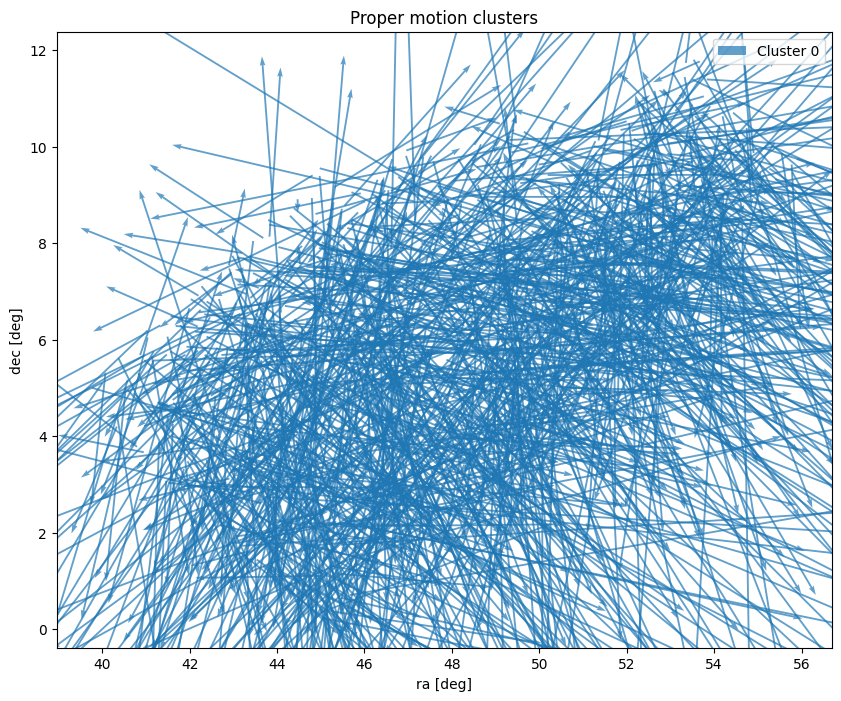

In [57]:
plt.figure(figsize=(10, 8))

clusters = np.unique(df_kin['cluster'])
clusters = clusters[clusters != -1]  # remove noise

cmap = plt.cm.tab10  # colormap categórico
colors = cmap(np.linspace(0, 1, len(clusters)))

for cl, color in zip(clusters, colors):
    mask = df_kin['cluster'] == cl
    
    plt.quiver(
        df_kin.loc[mask, 'ra'],
        df_kin.loc[mask, 'dec'],
        df_kin.loc[mask, 'pmra'],
        df_kin.loc[mask, 'pmdec'],
        angles='xy',
        scale_units='xy',
        scale=5,
        alpha=0.7,
        color=color,
        label=f'Cluster {cl}'
    )

plt.title('Proper motion clusters')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.legend()
plt.show()

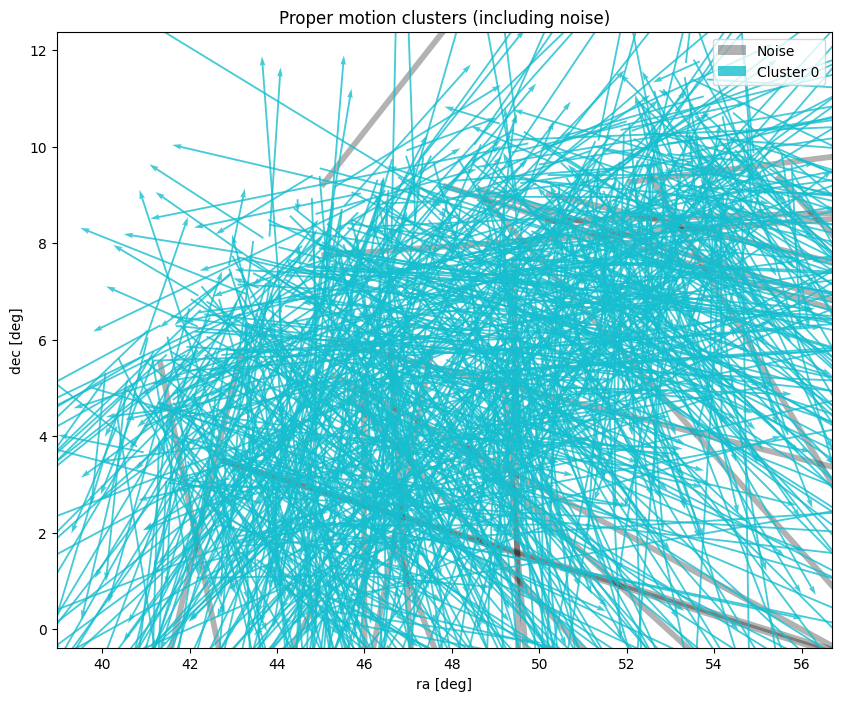

In [58]:
plt.figure(figsize=(10, 8))

clusters = np.unique(df_kin['cluster'])
cmap = plt.cm.tab10
colors = cmap(np.linspace(0, 1, len(clusters)))

for cl, color in zip(clusters, colors):
    mask = df_kin['cluster'] == cl
    
    if cl == -1:
        color = 'black'
        label = 'Noise'
        alpha = 0.3
    else:
        label = f'Cluster {cl}'
        alpha = 0.8

    plt.quiver(
        df_kin.loc[mask, 'ra'],
        df_kin.loc[mask, 'dec'],
        df_kin.loc[mask, 'pmra'],
        df_kin.loc[mask, 'pmdec'],
        angles='xy',
        scale_units='xy',
        scale=5,
        color=color,
        alpha=alpha,
        label=label
    )

plt.title('Proper motion clusters (including noise)')
plt.xlabel('ra [deg]')
plt.ylabel('dec [deg]')
plt.legend()
plt.show()

The figure shows the groups identified by DBSCAN in proper motion space (pmra, pmdec), projected onto their positions on the sky (ra, dec). Each color represents a set of stars with similar proper motion vectors, indicating a possible kinematic association, allowing us to verify whether the members of each cluster share a coherent motion pattern.

The spatial distribution reveals whether the group is physically concentrated (as in a star cluster) or dispersed across the sky, which may instead indicate a moving group.

### Conclusion

We can conclude that there is a cluster of stars with similar kinematic properties and positions, representing a stellar nursery capable of forming new stars, like the Sun that originated this way, and potentially new planets. Additionally, there are outliers that don't follow the cluster pattern, indicating stars with different motions or origins, possibly associated with rare events or special dynamical processes in the interstellar medium.